In [2]:
import matplotlib.pyplot as plt
from pulp import *
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
# import gurobipy
from gurobipy import Model, GRB
import seaborn as sns
import numpy as np
import pandas as pd
from matplotlib.colors import ListedColormap
import matplotlib.colors as mcolors
import pickle as pkl
import math
from tqdm import tqdm
from shapely import wkt
import matplotlib.colors as colors


In [2]:
with open('data/data.pkl', 'rb') as f:
    basins_info = pkl.load(f)
    protected_basins = pkl.load(f)
    main_to_basin = pkl.load(f)
    num_basins = pkl.load(f)

    species = pkl.load(f)
    species_orig_to_id = pkl.load(f)
    num_species = pkl.load(f)

    basin_species = pkl.load(f)
    species_basin = pkl.load(f)

    num_protected = pkl.load(f)
    total_area = pkl.load(f)
    protected_area = pkl.load(f)

with open('data/P.pkl', 'rb') as f:
    P = pkl.load(f)
    habitat_area_percentage = pkl.load(f)


non_protected_basins = set(i for i in range(num_basins) if i not in protected_basins) # 124019 basins

area_bound = 0.3
max_additional_area = area_bound * total_area - protected_area

basin_totalscore = np.sum(P, axis=0) # basin id -> total score

In [4]:
basins_info[0]

{'hybas_id': 6120000010,
 'main_id': 6030000010,
 'protected': 1.0,
 'area': 17.915473789311854}

In [14]:
# existence_matrix = np.zeros((num_basins, num_species))
# for i in tqdm(range(num_basins)):
#     for j in range(num_species):
#         if j in basin_species[i]:
#             existence_matrix[i][j] = 1

100%|██████████| 160584/160584 [00:58<00:00, 2732.94it/s]


In [13]:
# with open('slurm_logs/slurm-652197_max_theta.out', 'r') as f:
#     for i in range(108):
#         f.readline()

#     sol_max_theta = []
#     for i in range(num_basins):
#         s = f.readline()
#         ss = s.split(' = ')
#         # print(ss)
#         sol_max_theta.append(float(ss[1].strip('\n')))

# print(sol_max_theta)

[1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.1562216052518899, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.2154442103286329, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.3445652874254705, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.9626057563012439, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.3498470907292298, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0,

In [6]:
abs = [0.18, 0.2, 0.25, 0.3, 0.35, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
sols_max_theta = {}
max_thetas = {}
for ab in abs:
    # load the LP results from results/...
    with open(f'results/max_theta_ab{str(ab).replace(".", "")}.pkl', 'rb') as f:
        sol = pkl.load(f)
        max_theta = pkl.load(f)

        sols_max_theta[ab] = sol
        max_thetas[ab] = max_theta

In [7]:
sols_np_arrays = np.zeros((len(abs), num_basins))
for j in tqdm(range(len(abs))):
    sol = sols_max_theta[abs[j]]
    sol_list = [sol[i] for i in range(num_basins)]
    sols_np_arrays[j] = np.array(sol_list) 

100%|██████████| 11/11 [00:00<00:00, 78.06it/s]


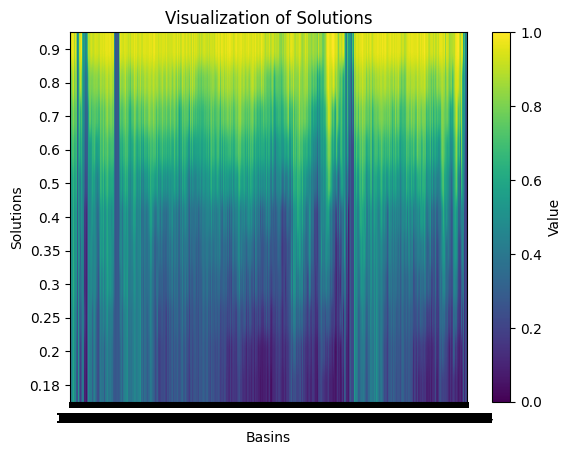

In [8]:
plt.imshow(sols_np_arrays, aspect='auto', cmap='viridis', origin='lower',
           norm=colors.Normalize(vmin=0, vmax=1))
plt.colorbar(label='Value')
plt.yticks(range(len(abs)), labels=abs)
plt.xticks(range(num_basins))
plt.ylabel('Solutions')
plt.xlabel('Basins')
plt.title('Visualization of Solutions')

plt.show()

In [21]:
with open(f'results/max_theta_ab03.pkl', 'rb') as f:
        sol3 = pkl.load(f)
        max_theta3 = pkl.load(f)

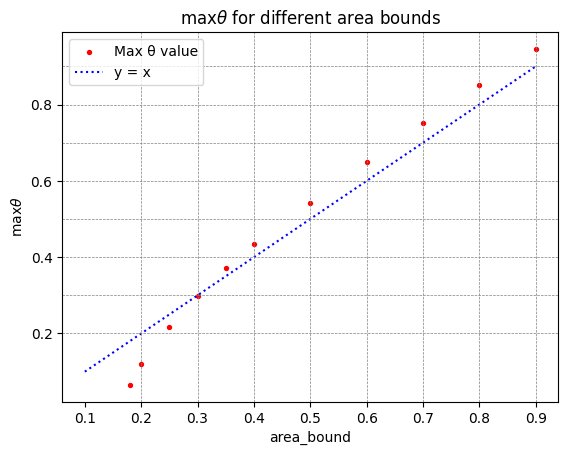

In [28]:
plt.scatter(abs, [max_thetas[ab] for ab in abs], s=8, color='red', label='Max θ value')
x = np.linspace(start=0.1, stop=0.9, num=100)
y = x
plt.plot(x, y, linestyle=':', color='blue', label='y = x')

# Adding vertical and horizontal lines
for ab in abs:
    if ab not in [0.18, 0.25, 0.35]:
        plt.axvline(x=ab, color='gray', linestyle='--', linewidth=0.5) # Vertical line to x-axis
        plt.axhline(y=ab, color='gray', linestyle='--', linewidth=0.5) # Horizontal line to y-axis

# Labels and title
plt.xlabel('area_bound')
plt.ylabel(r'$\max \theta$')
plt.title(r'$\max \theta$ for different area bounds')
plt.legend()

plt.savefig('visualize/trend_max_theta_area_bound.png')
plt.show()

In [19]:
sorted_basins = sorted(range(num_basins), key=lambda id: -len(basin_species[id]))
print(sorted_basins)

[35020, 35186, 35021, 35431, 35042, 35459, 35244, 35200, 35246, 35199, 35201, 35737, 35245, 35689, 35019, 35184, 126989, 34828, 35170, 126911, 34823, 35754, 126325, 126899, 35730, 126542, 127208, 35458, 34965, 126265, 126503, 127215, 33940, 34184, 126719, 35432, 126829, 34983, 127402, 33701, 35183, 35874, 35210, 127401, 34251, 37446, 127279, 34535, 34826, 36435, 126548, 127233, 127443, 35881, 36629, 35753, 36393, 36394, 34318, 35729, 36564, 127442, 33293, 33294, 33742, 33924, 33925, 34299, 35771, 35872, 35873, 126264, 126332, 126333, 126504, 33843, 34303, 34336, 35564, 35770, 36266, 36572, 36782, 36992, 126635, 126636, 126753, 126853, 35713, 36136, 34459, 35185, 35736, 36267, 32644, 33821, 35008, 126789, 126889, 34982, 35688, 35712, 35738, 35854, 35855, 36732, 127280, 35962, 33119, 35263, 35971, 126581, 126582, 126717, 126718, 127120, 32643, 33833, 34301, 34302, 34522, 34523, 34534, 34825, 34827, 34984, 34985, 35751, 35908, 36897, 127183, 36680, 127373, 32274, 33858, 35209, 37060, 3755

In [20]:
sorted_species = sorted(range(num_species), key=lambda id: -len(species_basin[id]))
print(sorted_species)

[897, 3994, 1762, 2039, 2477, 2273, 1456, 3615, 1115, 784, 941, 4152, 4025, 3473, 3316, 1983, 354, 0, 1731, 3852, 968, 4010, 1748, 2076, 1659, 2737, 2439, 2963, 3670, 3759, 2709, 3915, 3656, 3833, 3675, 1293, 3392, 2997, 1633, 4657, 1122, 4624, 1602, 49, 493, 4566, 3810, 2052, 1199, 2171, 1551, 4678, 2064, 3895, 3627, 3463, 4666, 326, 4591, 3398, 4029, 2690, 4622, 3559, 2058, 4161, 1755, 3945, 4011, 3369, 1290, 3282, 4128, 1825, 2212, 3731, 4605, 2217, 2601, 2533, 4854, 1501, 1741, 1093, 357, 657, 3669, 1558, 1275, 1877, 2642, 4897, 785, 3686, 111, 509, 938, 801, 251, 496, 139, 1904, 77, 1691, 608, 2379, 4422, 3855, 4634, 2123, 4347, 4206, 1879, 2887, 4420, 986, 4157, 4655, 20, 3376, 1457, 4480, 2474, 178, 4379, 2832, 1648, 1031, 612, 3149, 4110, 4547, 628, 1332, 2626, 2606, 1112, 4440, 3165, 1625, 297, 2146, 4709, 2782, 4348, 2615, 2072, 987, 429, 2074, 822, 4213, 613, 4484, 3434, 972, 3764, 1887, 2515, 3752, 3871, 2390, 1409, 3279, 4872, 2646, 4828, 2619, 3944, 4334, 4724, 2982, 1219

In [22]:
# with open('data/existence_matrix.pkl', 'wb') as f:
#     pkl.dump(existence_matrix, f)
#     pkl.dump(sorted_basins, f)
#     pkl.dump(sorted_species, f)

In [9]:
with open('data/existence_matrix.pkl', 'rb') as f:
    existence_matrix = pkl.load(f)
    sorted_basins = pkl.load(f)
    sorted_species = pkl.load(f)

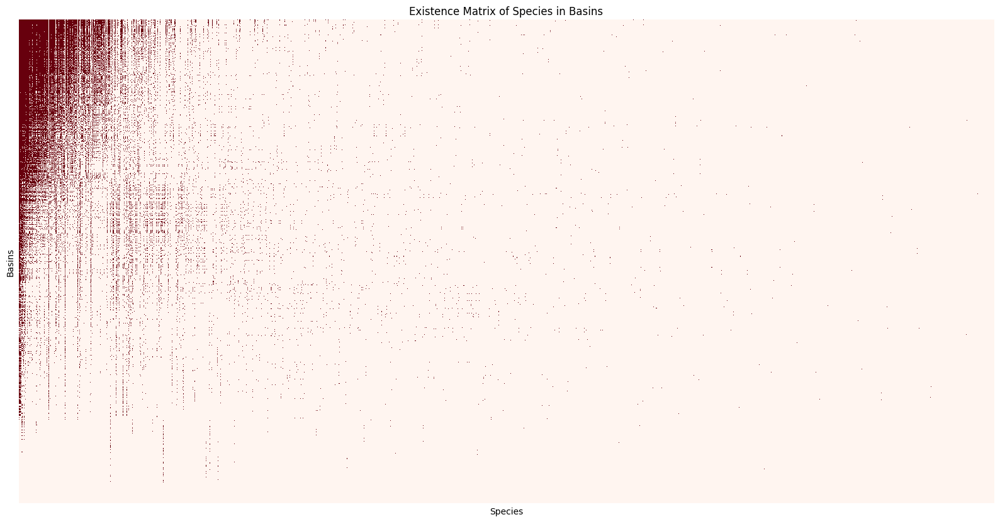

In [21]:
e_matrix = existence_matrix
sorted_e_matrix = e_matrix[sorted_basins] # sort rows
sorted_e_matrix = sorted_e_matrix[:, sorted_species] # sort columns

plt.figure(figsize=(20, 10))

sns.heatmap(sorted_e_matrix, cmap="Reds", cbar=False, xticklabels=False, yticklabels=False)
plt.title('Existence Matrix of Species in Basins')
plt.xlabel('Species')
plt.ylabel('Basins')
plt.show()

(160584, 4908) (160584,)


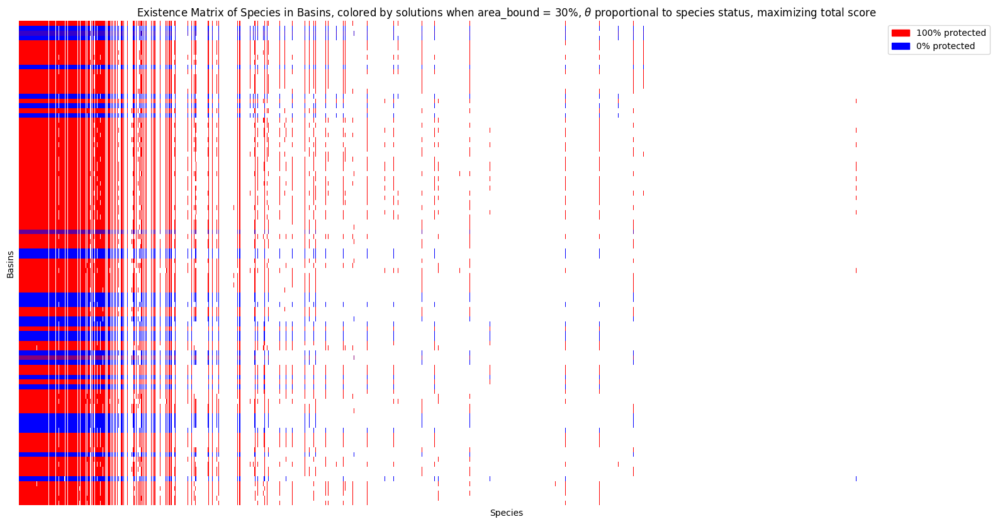

In [28]:
def visualize_solution(sol):
    # print(sol)
    sol = np.array([sol[i] for i in range(num_basins)])
    sol = sol*0.5 + 0.5

    colors = ["white", "blue", "red"]

    # Define the anchor points
    anchor_points = [0.0, 0.5, 1.0]

    # Create a LinearSegmentedColormap
    custom_cmap = mcolors.LinearSegmentedColormap.from_list("custom_map", list(zip(anchor_points, colors)))

    print(existence_matrix.shape, sol.shape)
    e_matrix = existence_matrix * sol[:, np.newaxis]

    sorted_e_matrix = e_matrix[sorted_basins] # sort rows
    sorted_e_matrix = sorted_e_matrix[:, sorted_species] # sort columns

    sorted_e_matrix = sorted_e_matrix[:100]


    plt.figure(figsize=(20, 10))  # You can adjust the size to fit your dataset
    sns.heatmap(sorted_e_matrix, cmap=custom_cmap, cbar=False, xticklabels=False, yticklabels=False)
    plt.title(r'Existence Matrix of Species in Basins, colored by solutions when area_bound = 30%, $\theta$ proportional to species status, maximizing total score')
    plt.xlabel('Species')
    plt.ylabel('Basins')
    # plt.savefig('solutions_visualization/'+'solutions{}.jpg'.format())
    red_patch = mpatches.Patch(color='red', label='100% protected')
    blue_patch = mpatches.Patch(color='blue', label='0% protected')
    
    # Add legend to the plot
    plt.legend(handles=[red_patch, blue_patch], loc='upper right')

    plt.show()

visualize_solution(sols_max_theta[0.3])

In [4]:
with open('data/basins_gdf.pkl', 'rb') as f:
    basins_gdf = pkl.load(f)
basins_gdf

,HYBAS_ID,MAIN_BAS,PROTECTED,geometry,AREA,uniqueID,id_no,sci_name
0,6120000010,6030000010,0.0,MULTIPOLYGON (((-78.95126173214317 9.549976434...,203.286676,1,"{49829891, 185872, 186393, 149249053, 188471, ...","{Leptophilypnus fluviatilis, Stegastes otophor..."
1,6120000010,6030000010,1.0,POLYGON ((-79.26719614708446 9.427248298070538...,17.915474,0,"{138525825, 49829891, 191108, 185989, 185990, ...","{Eleotris amblyopsis, Leptophilypnus fluviatil..."
2,6120000020,6030000010,0.0,"POLYGON ((-79.1000000000999 9.404166666258675,...",70.898202,2,"{138525825, 49829891, 191108, 185989, 185990, ...","{Eleotris amblyopsis, Leptophilypnus fluviatil..."
3,6120000030,6030000010,0.0,MULTIPOLYGON (((-79.0958333331418 9.3333333333...,114.441867,3,"{49829891, 185872, 186393, 149249053, 188471, ...","{Leptophilypnus fluviatilis, Stegastes otophor..."
4,6120000040,6030000010,0.0,POLYGON ((-79.09166666708296 9.300000000399734...,119.254719,4,"{49829891, 185872, 186393, 149249053, 53876256...","{Leptophilypnus fluviatilis, Cyphocharax magda..."
...,...,...,...,...,...,...,...,...
160579,6121361580,6030021870,0.0,MULTIPOLYGON (((-67.42083333309182 -54.3875000...,151.728962,160558,{},{}
160580,6121361600,6030021870,0.0,POLYGON ((-67.27083333339158 -54.4291666669080...,150.912373,160561,{},{}
160581,6121361620,6030021870,0.0,POLYGON ((-66.95416666705802 -54.6541666664584...,135.213482,160564,{},{}
160582,6121361670,6030021870,0.0,POLYGON ((-65.91666666643346 -54.7166666663335...,107.842155,160569,{},{}


In [4]:
color_current_protected = 'green'
color_non_protected = '#1f77b4'
color_new_protected = 'orange'
# gdf['color'] = gdf['uniqueID'].apply(lambda x: color_current_protected if x in protected_basins else color_non_protected)

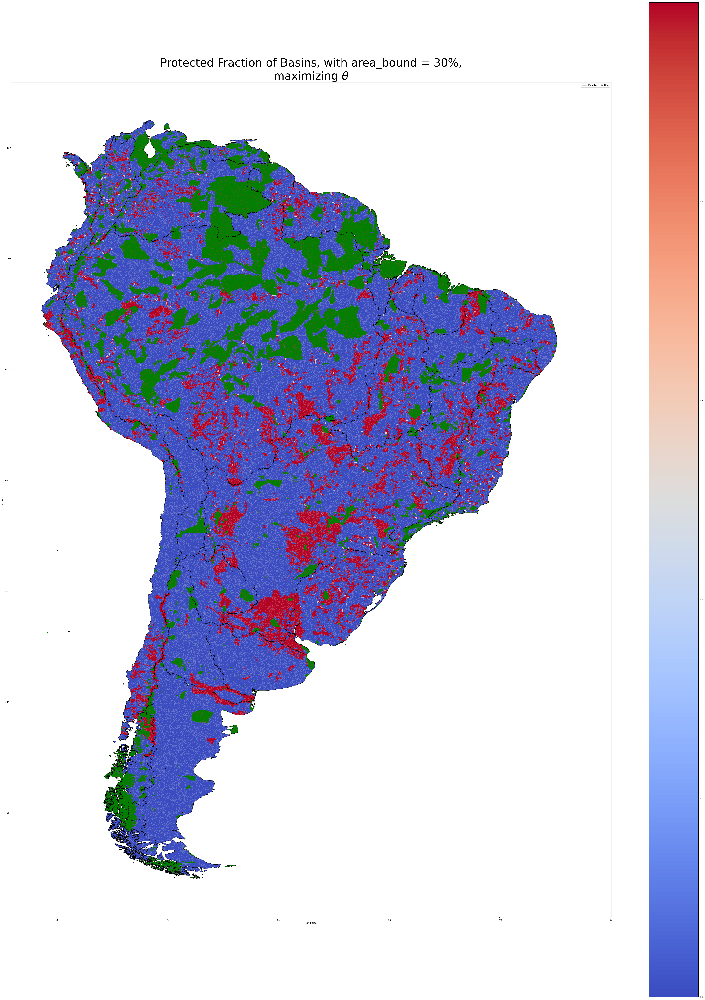

In [21]:
def plot_map_solution_cont(solution, file_path, subtitle):
    gdf = basins_gdf.copy()
    gdf['solution'] = gdf['uniqueID'].apply(lambda x: solution[x])
    fig, ax = plt.subplots(figsize=(60, 80))
    gdf.plot(column='solution', ax=ax, cmap='coolwarm', legend=True)  
    # override some colors
    # condition = gdf['ID'] in protected_basins # Update with your condition
    # gdf[condition].plot(ax=ax, color=color_current_protected)  # Use your preferred color
    gdf[basins_gdf['uniqueID'].isin(protected_basins)].plot(ax=ax, color=color_current_protected)


    # for idx, row in gdf.iterrows():
    #     # Get the centroid of the shape
    #     centroid = row.geometry.centroid
    #     # Get the ID (or any other attribute)
    #     shape_id = row['ID']  # Replace 'id' with the actual column name
    #     # Place the text annotation
    #     plt.text(centroid.x, centroid.y, str(shape_id), fontsize=8, ha='center', va='center')

    # Create legend handles
    # protected_patch = mpatches.Patch(color=color_current_protected, label='Protected Areas')
    # non_protected_patch = mpatches.Patch(color=color_non_protected, label='Non-Protected Areas')
    # new_protected_patch = mpatches.Patch(color=color_new_protected, label='Newly Protected Areas')

    # plt.colorbar(ax.collections[0], ax=ax, orientation='vertical')

    # Add the legend to the plot
    # plt.legend(handles=[new_protected_patch, protected_patch, non_protected_patch], fontsize='large')

    main_basins_outline = gdf.dissolve(by='MAIN_BAS')

    # Plot the outlines of main basins
    main_basins_outline.boundary.plot(ax=ax, color='black', linewidth=1, label='Main Basin Outline')

    # Adding legend
    ax.legend()


    plt.title("Protected Fraction of Basins, with area_bound = 30%,\n"+subtitle, fontsize=50)
    # ax.set_title(subtitle)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    plt.savefig(file_path)
    plt.show()

    # plt.savefig('map/'+filename+'.jpg')
plot_map_solution_cont(sols_max_theta[0.3], 'visualize/map_outlined_sol_max_theta_ab03', r'maximizing $\theta$')

In [8]:
def compute_scores(solution):
    scores_list = []
    for j in tqdm(range(num_species)):
        score = sum([P[j][i] * solution[i] for i in range(num_basins)])
        scores_list.append(score)
        # score1 = sum([basins_info['area'][i]*solution[i] for i in species_basin[j]])/habitat_areas[j]
        # assert abs(score - score1)<1e-5
    return scores_list

scores_max_theta_ab03 = compute_scores(sols_max_theta[0.3])

100%|██████████| 4908/4908 [04:41<00:00, 17.46it/s]


In [9]:
scores_max_theta = {}
scores_max_theta[0.3] = scores_max_theta_ab03

In [10]:
# with open('data/scores_max_theta.pkl', 'wb') as f:
#     pkl.dump(scores_max_theta, f)

In [3]:
# NOTE: currently scores_max_theta.pkl only stores the scores for ab=0.3. Can add others if needed

# with open('data/scores_max_theta.pkl', 'rb') as f:
#     scores_max_theta = pkl.load(f)

In [19]:
def scores_visualize(scores, title, file_path):
    x = range(num_species)

    plt.figure(figsize=(60, 40))
    # for theta in status_to_theta[1:]:
    plt.axhline(y=0.29, color='grey', linestyle=':')

    plt.bar(x, scores, color='orange', label='score = protected habitat area/habitat area')
    plt.bar(x, habitat_area_percentage, color='blue', label='habitat area/total area')

    x1 = [i for i in x if habitat_area_percentage[i]>scores_max_theta_ab03[i]]
    score3_1 = [scores[i] for i in x1]
    # habitat_area_percentage_1 = [habitat_area_percentage[i] for i in x1]
    plt.bar(x1, score3_1, color='orange')

    # Adding labels and title (optional)
    plt.xlabel('Species', fontsize=30)
    plt.ylabel('Values', fontsize=30)
    plt.title(title, fontsize=40)
    # plt.title(r'Habitat Area and Protection Score for Each Species, with area_bound = 30%, $\theta=0.29$, maximizing total score', fontsize=40)
    plt.xticks(x)  # Set the x-ticks to correspond to the species
    # plt.yticks(plt.yticks()[0]+[0.3])

    for label in plt.gca().get_xticklabels():
        label.set_rotation(90)  # Rotate labels by 45 degrees
        label.set_ha('right')   # Align the labels to the right (ha = horizontal alignment)
    plt.gca().tick_params(axis='x', labelsize=10)  # Set font size to 10


    # Adding a legend
    plt.legend(fontsize=40)

    # Show the plot
    plt.savefig(file_path)

# scores_visualize(scores_max_theta_ab03, r'Habitat Area and Protection Score for Each Species, with area_bound = 30%, maximizing $\theta$', 'visualize/scores_max_theta_ab03_all.png')

In [21]:
with open('results/max_totalscore_theta029.pkl', 'rb') as f:
    sol_max_totalscore_theta029 = pkl.load(f)

scores_max_totalscore_theta029 = compute_scores(sol_max_totalscore_theta029)
scores_max_totalscore = {}
scores_max_totalscore[0.29] = scores_max_totalscore_theta029

  0%|          | 0/4908 [00:00<?, ?it/s]

100%|██████████| 4908/4908 [04:45<00:00, 17.22it/s]


In [22]:
# with open('data/scores_max_totalscore.pkl', 'wb') as f:
#     pkl.dump(scores_max_totalscore, f)

/home/fs01/ym277/miniconda3/envs/dam/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


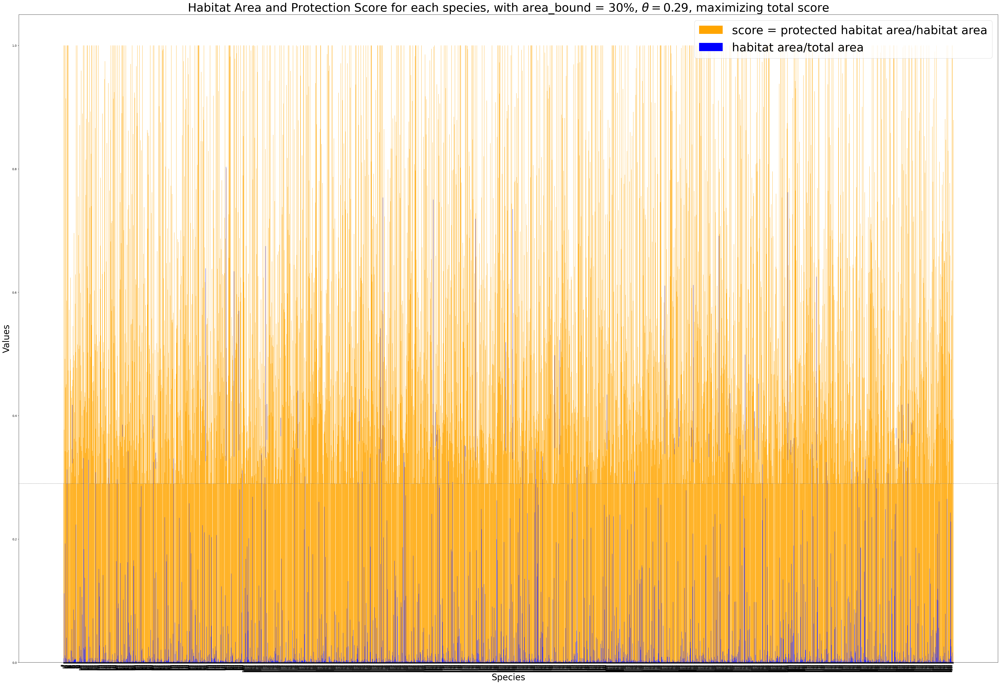

In [23]:
title_029 = r'Habitat Area and Protection Score for each species, with area_bound = 30%, $\theta=0.29$, maximizing total score'
path_029 = 'visualize/scores_max_totalscore_theta029_all.png'
scores_visualize(scores_max_totalscore_theta029, title_029, path_029)

In [26]:
# whether sol1 -> sol2 is increasing for each basin
def sols_increase(sol1, sol2):
    cnt = 0
    for i in range(num_basins):
        if sol2[i] < sol1[i]:
            # print(i, sol1[i], sol2[i])
            cnt += 1
    # print(cnt)
    return cnt

# sols_increase(sols_max_theta[0.2], sols_max_theta[0.3])
for i in range(len(abs)-1):
    ab1 = abs[i]
    ab2 = abs[i+1]
    cnt = sols_increase(sols_max_theta[ab1], sols_max_theta[ab2])
    print(ab1, ab2, cnt)

0.18 0.2 874
0.2 0.25 1950
0.25 0.3 4109
0.3 0.35 4094
0.35 0.4 3995
0.4 0.5 8148
0.5 0.6 624
0.6 0.7 526
0.7 0.8 493
0.8 0.9 245
